# Protocol for Training Interpretable GNN Models Using HCat-GNet in Chemical Databases

This notebook contains the code necesary to replicate the experiments and obtain the results reported in the paper [HCat-GNet: a Human-Interpretable GNN Tool for Ligand Optimization in Asymmetric Catalysis](https://www.cell.com/iscience/fulltext/S2589-0042(25)00141-5). We aim to provide a simple list of steps to replicate all the results in a few lines of code, and potentially apply this protocol to *any* chemical database of interest.

## Training on the RhCAA dataset

First, let's import all the necesary functions that are going to allow us to perform the experiments.

In [1]:
from scripts_experiments.train_GNN import train_network_nested_cv
from pathlib import Path
import pandas as pd
from data.rhcaa import rhcaa_diene

In the cell of code bellow, we define variables that are necessary for our code to work:
- `mol_cols` is a list containing the name of the columns in the csv containing the smiles of the molecules that interact to give an experimental observable (for our case, enantioselectivity). For our database, this will be: 'Ligand', 'substrate', and 'boron reagent'.
- `folds` is an integer containing the information of how many folds we wish to split dataset into. In our paper, this is set to 10.
- `global_seed` is an integer defined to allow reproducibility of experiments, so that each time the training is run, it delivers the same results. We defined this as 20232023 in our experiments.
- `include_Hs` is whether or not to include explicit hydrogens in the molecular graph representation.
- `root` is the path where our dataset is stored. Our software relies on `torch_geometric`, and as so, the last directory where our dataset is stored must be called 'raw', however, the raw must be ommited from the path definiction, therefore, if the file is in the directory "data/datasets/rhcaa/known_unknown/learning/raw", we only specify "data/datasets/rhcaa/known_unknown/learning", as done below.
- `filename` is the name of the file we wish to model.

In [2]:
filename = "rhcaa.csv"
root = Path("data") / "datasets" / "rhcaa" / "known_unknown" / "learning"
mol_cols = ["Ligand", "substrate", "boron reagent"]
target_variable = "ddG"
include_Hs = True
folds = 10
global_seed = 20232023

### Training the GNN model

`dataset` is a variable that is going to store our molecular graph representation dataset. This is built using the class `rhcaa_diene`, which expects some of the arguments we defined below. This dataset is going to be the one used by our model to learn correlations between molecular graph structure and observale property (enantioselectivity).

In [3]:
dataset = rhcaa_diene(
    filename=filename,
    root=root,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=folds,
    random_seed=global_seed,
)

`dir_results` is the parent directory where we wish to save the results obtained from the model training and evaluation.

In [4]:
dir_results = Path("TRIAL") / dataset._name / "learning"

`dir_results_GNN` is where the GNN results will be logged.

In [5]:
dir_results_GNN = dir_results / "results_GNN"

By running the `train_network_nested_cv` function, the model is trained, using the dataset provided as argument of the function.

In [6]:
train_network_nested_cv(
    graph_dataset=dataset,
    log_results_dir=dir_results_GNN,
    folds=folds,
    global_seed=global_seed,
)

Initialising chiral diene ligands experiment using early stopping
Using device: cpu
1/90-Epoch 000 | Train loss: 7.797 kJ/mol | Validation loss: 6.807 kJ/mol | Test loss: 4.879 kJ/mol
New best validation loss: 6.8065 found at epoch 0
1/90-Epoch 001 | Train loss: 5.070 kJ/mol | Validation loss: 7.176 kJ/mol | Test loss: 5.261 kJ/mol
1/90-Epoch 002 | Train loss: 5.421 kJ/mol | Validation loss: 6.305 kJ/mol | Test loss: 4.924 kJ/mol
1/90-Epoch 003 | Train loss: 4.933 kJ/mol | Validation loss: 6.299 kJ/mol | Test loss: 4.579 kJ/mol
1/90-Epoch 004 | Train loss: 4.894 kJ/mol | Validation loss: 6.275 kJ/mol | Test loss: 4.603 kJ/mol
1/90-Epoch 005 | Train loss: 4.733 kJ/mol | Validation loss: 6.088 kJ/mol | Test loss: 5.144 kJ/mol
New best validation loss: 6.0875 found at epoch 5
1/90-Epoch 006 | Train loss: 5.035 kJ/mol | Validation loss: 6.531 kJ/mol | Test loss: 4.596 kJ/mol
1/90-Epoch 007 | Train loss: 4.660 kJ/mol | Validation loss: 6.300 kJ/mol | Test loss: 4.500 kJ/mol
1/90-Epoch 008 |

### Training the traditional machine learning models. 

After training the GNN models, we train the TML models to compare the performance of both approaches. First, import the `train_tml_model_nested_cv` function.

In [7]:
from scripts_experiments.train_TML import train_tml_model_nested_cv

Then, we read the csv that contains the information of descriptors of the molecules (steric and electronic parameters), the target variable to model (ddG), and the folds to split the data (this is to make sure that both GNN and TML are trained and evaluated using the exact same sets of data). To read the data, we use the `pd.read_csv` function, and provide the path where we can find such csv. Notice that the path is the same as the one used for the molecular graph dataset (`root`), but in this case we must include the 'raw' directory and the file name, so that the function nows that is the file to be read.

In [8]:
data = pd.read_csv(root / "raw" / dataset.filename)
data.sample(10, random_state=global_seed)

,Unnamed: 0,index,%top,ddG,Ligand,ER1,ER2,ER3,ER4,ER5,...,substrate,temp,time,yield,Original,Confg,ligand_num,fam,category,fold
336,336,336,2.50,-9.081853,C=CCC1=C[C@@]2(C)C(CC(C)C)=C[C@@H]1[C@](C)(OC)C2,0.00,0.00,0.07,0.00,-0.17,...,O=C1C=CCCC1,25,1.00,87.0,0,1,3,fam6,0,9
357,357,357,99.00,12.728370,C[C@@]1(C2(C)C)C(C3=CC=CC=C3)=C[C@H]2C(C4=CC=C...,0.00,-0.17,-0.01,0.00,0.00,...,O=C(/C=C/C(OC(C)(C)C)=O)OC(C)(C)C,60,1.00,99.0,0,1,10,fam2,1,3
141,141,141,2.00,-9.485906,C1(C2=CC=CC=C2)=C[C@@H]3C(C4=CC=CC=C4)=C[C@H]1CC3,-0.01,0.00,0.00,-0.01,0.00,...,O=C(/C(C#N)=C/C1=CC=CC=C1)OC,20,1.00,96.0,1,2,17,fam3,0,0
569,569,569,3.50,-8.222192,CC(C=CC=C1C)=C1C2=C[C@@H]3C=C[C@@]2(C)C[C@]3(OC)C,0.00,0.00,0.00,0.00,-0.17,...,O=C1C=CCCCC1,25,1.00,53.0,0,2,16,fam5,0,2
607,607,607,3.75,-8.719284,C[C@]1(C[C@@]2(OC)C)C(CC(C)C)=C[C@@H]2C(CC3=CC...,-0.09,0.00,0.00,-0.12,-0.17,...,O=C(/C=C/C1=CC=CC=C1)OC(C)(C)C,50,1.25,85.0,0,2,73,fam6,0,1
345,345,345,85.00,4.660579,C1(CC2=CC=CC=C2)=C[C@H]3C(CC4=CC=CC=C4)=C[C@@H...,0.00,0.00,-0.09,0.00,0.00,...,O=C(N1C)C=CC1=O,50,3.00,89.0,0,1,1,fam1,1,5
603,603,603,5.00,-7.911209,C[C@]1(C[C@@]2(OC)C)C(CC(C)C)=C[C@@H]2C(CC3=CC...,-0.09,0.00,0.00,-0.12,-0.17,...,O=C(/C=C/C1=CC=CS1)OC(C)(C)C,50,14.00,65.0,0,2,73,fam6,0,7
586,586,586,1.50,-11.243289,C=CCC1=C[C@@]2(C)C(CC(C)C)=C[C@@H]1[C@](C)(OC)C2,0.00,0.00,0.07,0.00,-0.17,...,O=C1CCCC=C1,50,1.00,96.0,0,1,3,fam6,0,1
454,454,454,98.00,9.485906,C1(C2=CC=CC=C2)=C[C@H]3C(C4=CC=CC=C4)=C[C@@H]1CC3,0.00,0.00,-0.01,0.00,0.00,...,O=C1C=CC2(OCCO2)CC1,20,20.00,80.0,0,1,17,fam3,1,8
229,229,229,3.00,-8.617138,CC(C)(C1=C[C@@H]2C=C[C@H]1C2)OCOCC3=CC=CC=C3,0.00,0.00,0.00,0.00,0.00,...,O=C1C=CCCCC1,25,2.00,83.0,1,2,66,fam1,0,1


Before using the csv file as input, it requires some preprocessing. First, it is necessay to define the name of the columns containing the descriptors of the molecules. To do this, we store the names as list called `descriptors`. After that, we eliminate all those columns that are not necessaty for the model training. We keep only the descriptors, the target variable ddG, the fold each point corresponds to, and the index of the reaction for identification porpuses.

In [9]:
descriptors = [
    "LVR1",
    "LVR2",
    "LVR3",
    "LVR4",
    "LVR5",
    "LVR6",
    "LVR7",
    "VB",
    "ER1",
    "ER2",
    "ER3",
    "ER4",
    "ER5",
    "ER6",
    "ER7",
    "SStoutR1",
    "SStoutR2",
    "SStoutR3",
    "SStoutR4",
    "temp",
]

data = data[descriptors + [target_variable, "fold", "index"]]
data.sample(10, random_state=global_seed)

,LVR1,LVR2,LVR3,LVR4,LVR5,LVR6,LVR7,VB,ER1,ER2,...,ER6,ER7,SStoutR1,SStoutR2,SStoutR3,SStoutR4,temp,ddG,fold,index
336,0.000000,0.000000,36.233741,0.000000,21.574215,73.462170,76.074168,134.623998,0.00,0.00,...,-0.12,-0.27,22.511984,19.435100,0.000000,0.000000,25,-9.081853,9,336
357,0.000000,21.574215,76.888305,0.000000,0.000000,76.888305,54.847956,207.234074,0.00,-0.17,...,-0.01,-0.17,26.425538,0.000000,26.425538,0.000000,60,12.728370,3,357
141,76.888305,0.000000,0.000000,76.888305,0.000000,0.000000,32.691970,153.907618,-0.01,0.00,...,0.00,0.00,17.938065,0.000000,19.222076,13.649029,20,-9.485906,0,141
569,0.000000,0.000000,0.000000,111.480276,21.574215,0.000000,76.074168,134.623998,0.00,0.00,...,0.00,-0.27,22.511984,18.722062,0.000000,0.000000,25,-8.222192,2,569
607,94.184290,0.000000,0.000000,73.462170,21.574215,0.000000,76.074168,160.710210,-0.09,0.00,...,0.00,-0.27,26.425538,0.000000,19.222076,0.000000,50,-8.719284,1,607
345,0.000000,0.000000,94.184290,0.000000,0.000000,94.184290,20.255985,134.623998,0.00,0.00,...,-0.09,0.00,18.673576,13.863991,0.000000,0.000000,50,4.660579,5,345
603,94.184290,0.000000,0.000000,73.462170,21.574215,0.000000,76.074168,175.369737,-0.09,0.00,...,0.00,-0.27,26.425538,0.000000,21.147273,0.000000,50,-7.911209,7,603
586,0.000000,0.000000,36.233741,0.000000,21.574215,73.462170,76.074168,175.369737,0.00,0.00,...,-0.12,-0.27,22.511984,19.435100,0.000000,0.000000,50,-11.243289,1,586
454,0.000000,0.000000,76.888305,0.000000,0.000000,76.888305,32.691970,160.710210,0.00,0.00,...,-0.01,0.00,22.511984,26.228722,0.000000,0.000000,20,9.485906,8,454
229,180.948685,0.000000,0.000000,0.000000,0.000000,0.000000,20.255985,134.623998,0.00,0.00,...,0.00,0.00,22.511984,18.722062,0.000000,0.000000,25,-8.617138,1,229


We then define the directory to save the TML results.

In [10]:
def dir_results_TML(algorithm: str, representation: str) -> Path:
    return dir_results / "results_TML" / algorithm / representation

The function `train_tml_model_nested_cv` allows to train the TML model using the input data provided. Similar to the GNN training function, it expects from us to tell the name of the columns where the molecule's smiles are stored (mol_cols), the directory where the results will be saved, and the global seed. Also, it expects as an input which TML algorithm to use for training. For random forest, input 'rf', for Gradient Boosting 'gb', and for linear regression 'lr'.

In [11]:
train_tml_model_nested_cv(
    data_csv=data,
    mol_cols=mol_cols,
    descriptors=descriptors,
    target_variable=target_variable,
    log_results_dir=dir_results_TML("rf", "bespoke"),
    tml_algorithm="rf",
    global_seed=global_seed,
)

train_tml_model_nested_cv(
    data_csv=data,
    mol_cols=mol_cols,
    descriptors=descriptors,
    target_variable=target_variable,
    log_results_dir=dir_results_TML("gb", "bespoke"),
    tml_algorithm="gb",
    global_seed=global_seed,
)

train_tml_model_nested_cv(
    data_csv=data,
    mol_cols=mol_cols,
    descriptors=descriptors,
    target_variable=target_variable,
    log_results_dir=dir_results_TML("lr", "bespoke"),
    tml_algorithm="lr",
    global_seed=global_seed,
)

Initialising chiral ligands selectivity prediction using a traditional ML approach.
Number of splits: 10
Total number of runs: 90
Hyperparameter optimisation starting...
Features shape:  (668, 20)
Y target variable shape:  (668,)
ML algorithm to be tunned: RandomForestRegressor()
Fitting 3 folds for each of 480 candidates, totalling 1440 fits
Best hyperparameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 500, 'random_state': 20232023} 

Hyperparameter optimisation has finalised
Training starting...
********************************
Outer: 1 | Inner: 2 | Run 1/90 | Train RMSE 1.004 kJ/mol | Val RMSE 3.417 kJ/mol | Test RMSE 3.353 kJ/mol
Outer: 1 | Inner: 3 | Run 2/90 | Train RMSE 1.062 kJ/mol | Val RMSE 2.054 kJ/mol | Test RMSE 3.205 kJ/mol
Outer: 1 | Inner: 4 | Run 3/90 | Train RMSE 1.048 kJ/mol | Val RMSE 2.485 kJ/mol | Test RMSE 3.469 kJ/mol
Outer: 1 | Inner: 5 | Run 4/90 | Train RMSE 1.057 kJ/mol | Val RMSE 2.656 kJ/mol | Test RMSE 3.131 kJ/m

### Plot and compare results

We created a function that allows direct comparison of results between the two methodologies, including comparison of metrics per fold, and statistical tests to  determine if there was or not signifficant difference. We import the `plot_results` function and pass the parameters of:
- save_path: path where we want the results to be stored
- experiments_gnn_path: path where we stored the GNN experiments.
- experiments_tml_path: path where we stored the TML experiments.

In [12]:
from scripts_experiments.compare_gnn_tml import plot_results

Generate a path to save the comparison results.

In [13]:
def comparison_path_generator(log_dir, tml_algorithm, descriptors):
    return log_dir / "comparison" / f"GNN_vs_{tml_algorithm}" / descriptors

Generate the comparisons.

In [14]:
plot_results(
    save_dir=comparison_path_generator(dir_results, "rf", "bespoke"),
    experiments_gnn_path=dir_results_GNN,
    experiments_tml_path=dir_results_TML("rf", "bespoke"),
    tml_algorithm="rf",
)

plot_results(
    save_dir=comparison_path_generator(dir_results, "gb", "bespoke"),
    experiments_gnn_path=dir_results_GNN,
    experiments_tml_path=dir_results_TML("gb", "bespoke"),
    tml_algorithm="gb",
)

plot_results(
    save_dir=comparison_path_generator(dir_results, "lr", "bespoke"),
    experiments_gnn_path=dir_results_GNN,
    experiments_tml_path=dir_results_TML("lr", "bespoke"),
    tml_algorithm="lr",
)

Plot MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke
CSV for MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke
Plot RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke
CSV for RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke
Plot R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke
CSV for R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke
Plot Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke
CSV for Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke
Plot Precision_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke


/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:81: RuntimeWarning: invalid value encountered in scalar divide
  t_stat = (mean_gnn[i] - mean_tml[i]) / se_diff
/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:82: RuntimeWarning: invalid value encountered in scalar divide
  df = (se_gnn**2 + se_tml**2) ** 2 / (


All plots have been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_rf/bespoke


Final metrics for GNN:
Accuracy: 0.987
Precision: 0.990
Recall: 0.985
R2: 0.916
MAE: 1.937
RMSE: 2.714 

Final metrics for rf:
Accuracy: 0.981
Precision: 0.979
Recall: 0.982
R2: 0.907
MAE: 1.915
RMSE: 2.867 

Plot MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_gb/bespoke
CSV for MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_gb/bespoke
Plot RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_gb/bespoke
CSV for RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_gb/bespoke
Plot R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_gb/bespoke
CSV for R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_gb/bespoke
Plot Accuracy_GNN_vs_TML has been

/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:81: RuntimeWarning: invalid value encountered in scalar divide
  t_stat = (mean_gnn[i] - mean_tml[i]) / se_diff
/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:82: RuntimeWarning: invalid value encountered in scalar divide
  df = (se_gnn**2 + se_tml**2) ** 2 / (


All plots have been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_gb/bespoke


Final metrics for GNN:
Accuracy: 0.987
Precision: 0.990
Recall: 0.985
R2: 0.916
MAE: 1.937
RMSE: 2.714 

Final metrics for gb:
Accuracy: 0.974
Precision: 0.974
Recall: 0.974
R2: 0.882
MAE: 2.084
RMSE: 3.226 

Plot MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_lr/bespoke
CSV for MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_lr/bespoke
Plot RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_lr/bespoke
CSV for RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_lr/bespoke
Plot R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_lr/bespoke
CSV for R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_lr/bespoke
Plot Accuracy_GNN_vs_TML has been

/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:81: RuntimeWarning: divide by zero encountered in scalar divide
  t_stat = (mean_gnn[i] - mean_tml[i]) / se_diff
/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:82: RuntimeWarning: invalid value encountered in scalar divide
  df = (se_gnn**2 + se_tml**2) ** 2 / (
/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:81: RuntimeWarning: invalid value encountered in scalar divide
  t_stat = (mean_gnn[i] - mean_tml[i]) / se_diff
/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:82: RuntimeWarning: invalid value encountered in scalar divide
  df = (se_gnn**2 + se_tml**2) ** 2 / (
/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:81: RuntimeWarning: divide by zero encountered in scalar divide
  t_stat = (mean_gnn[i] - mean_tml[i]) / se_diff
/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:82: RuntimeWarning

All plots have been saved in the directory TRIAL/rhcaa_diene/learning/comparison/GNN_vs_lr/bespoke


Final metrics for GNN:
Accuracy: 0.987
Precision: 0.990
Recall: 0.985
R2: 0.916
MAE: 1.937
RMSE: 2.714 

Final metrics for lr:
Accuracy: 0.936
Precision: 0.937
Recall: 0.936
R2: 0.598
MAE: 4.345
RMSE: 5.949 



At this point, you should be able to see the results in the `dir_results` path you provided for the 'learning' set.

Lastly, we can visualise the results of each TML algorithm compared to the GNN model in a parity plot using the code below.

In [15]:
from hcatgnet.utils.plot_utils import plot_mean_predictions

In [16]:
results_rf = pd.read_csv(
    comparison_path_generator(dir_results, "rf", "bespoke") / "predictions_all.csv"
)
results_gb = pd.read_csv(
    comparison_path_generator(dir_results, "gb", "bespoke") / "predictions_all.csv"
)
results_lr = pd.read_csv(
    comparison_path_generator(dir_results, "lr", "bespoke") / "predictions_all.csv"
)

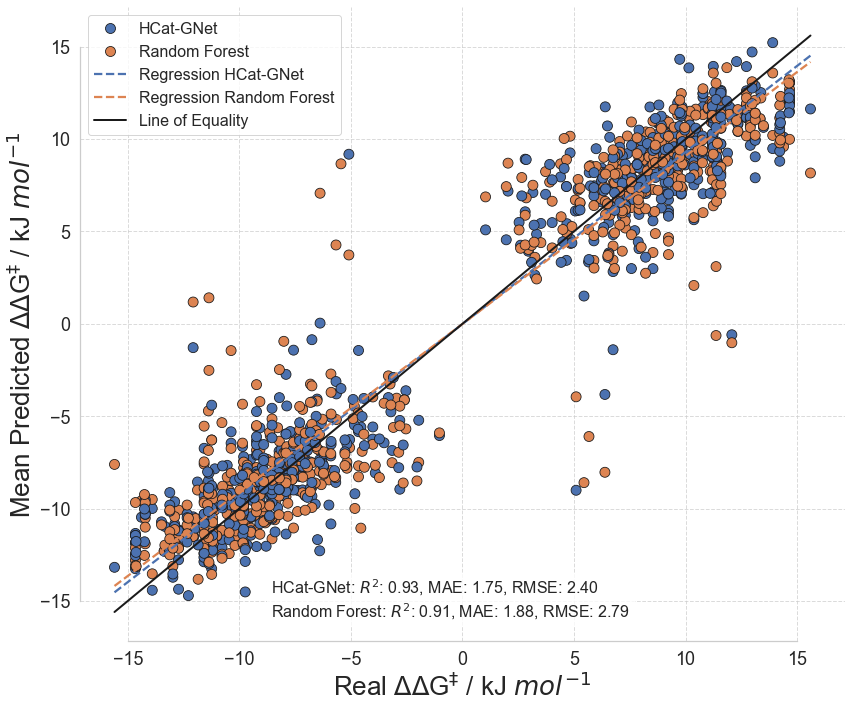

In [17]:
plot_mean_predictions(results_rf)

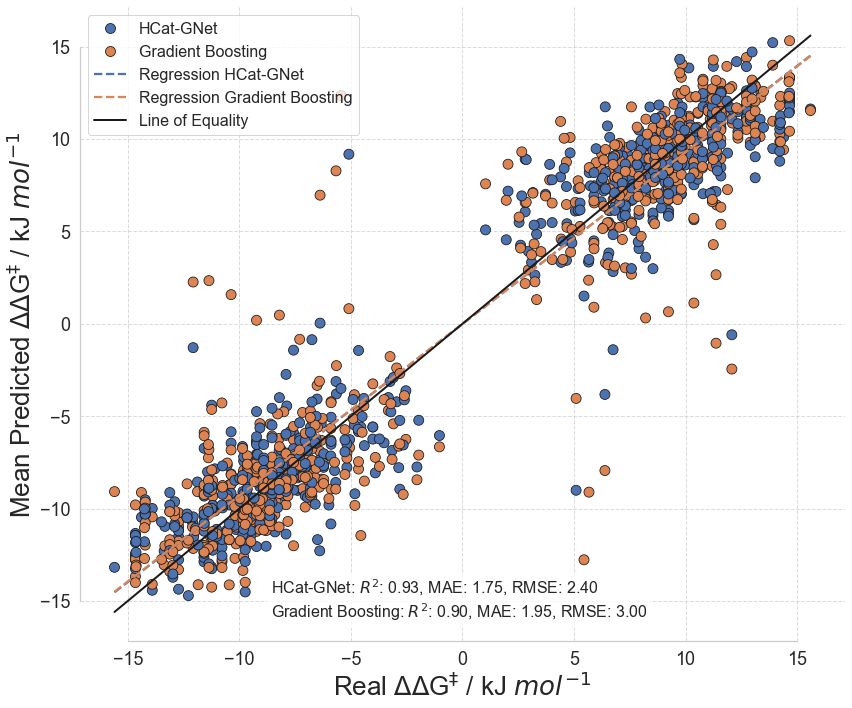

In [18]:
plot_mean_predictions(results_gb)

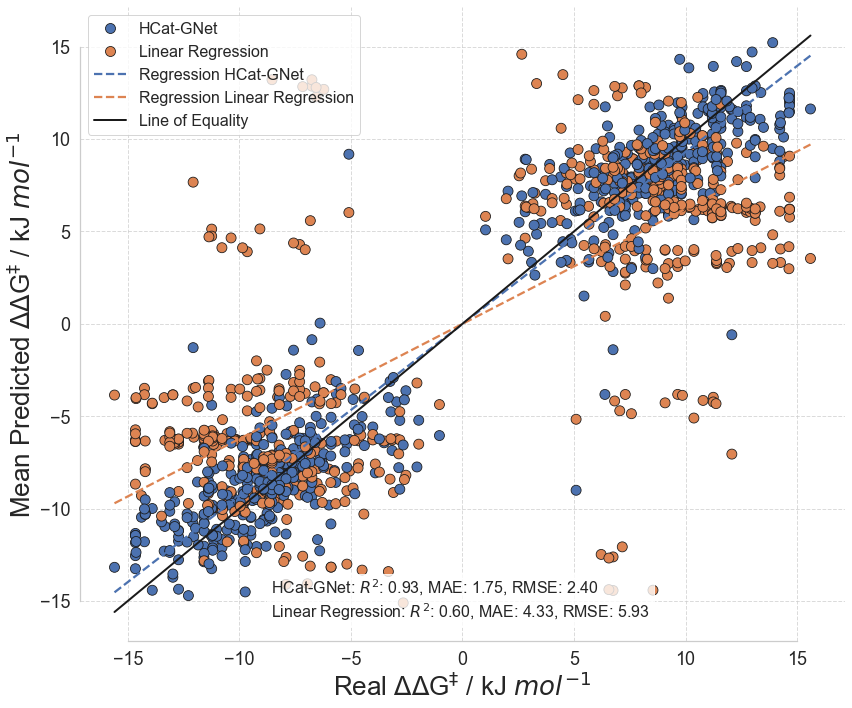

In [19]:
plot_mean_predictions(results_lr)

### Evaluation of the models on the Unseen Set

Import the necessary libraries and functions.

In [20]:
from scripts_experiments.predict_test import predict_final_test

Similarly as before, we need to provide information about where in our computer the unseen set is stored. Same as the case before, we need to provide the root (where it is stored excluding the 'raw' directory), the filename, and the path where we would like to store the results.

In [21]:
root_test = Path("data") / "datasets" / "rhcaa" / "known_unknown" / "test"
filename_test = "rhcaa.csv"
dir_results_test = Path("TRIAL") / dataset._name / "test"

Now let's create the molecular graph dataset.

In [22]:
test_graph_dataset = rhcaa_diene(
    filename=filename_test,
    root=root_test,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=None,
)

Read the csv containing the unseen set.

In [23]:
test_dataset = pd.read_csv(root_test / "raw" / filename_test)
test_dataset = test_dataset[descriptors + [target_variable, "index"]]
test_dataset.sample(10, random_state=global_seed)

,LVR1,LVR2,LVR3,LVR4,LVR5,LVR6,LVR7,VB,ER1,ER2,...,ER5,ER6,ER7,SStoutR1,SStoutR2,SStoutR3,SStoutR4,temp,ddG,index
14,0.00,92.25,189.54,0.000000,0,105.930000,77.3,134.623998,0.00,-0.93,...,0,-0.03,-0.16,22.511984,19.4351,0.000000,0.000,30,13.341990,682
19,0.00,92.25,189.54,0.000000,0,21.574215,77.3,134.623998,0.00,-0.93,...,0,-0.17,-0.16,26.425538,0.0000,21.574215,0.000,35,10.721397,687
36,0.00,34.21,148.89,0.000000,0,79.850000,77.3,134.623998,0.00,-0.93,...,0,-0.01,-0.16,22.511984,19.4351,0.000000,0.000,30,9.234156,704
51,0.00,119.37,33.32,0.000000,0,24.530000,77.3,134.623998,0.00,-0.56,...,0,-0.17,-0.16,22.511984,19.4351,0.000000,0.000,30,3.416170,719
18,189.54,92.25,0.00,21.574215,0,0.000000,77.3,134.623998,0.41,-0.93,...,0,0.00,-0.16,26.425538,0.0000,21.574215,0.000,35,-8.497966,686
22,189.54,92.25,0.00,21.574215,0,0.000000,77.3,134.623998,0.41,-0.93,...,0,0.00,-0.16,18.375829,0.0000,21.574215,0.000,100,-14.256615,690
40,0.00,124.12,0.00,98.460000,0,0.000000,77.3,134.623998,0.00,-0.56,...,0,0.00,-0.16,22.511984,19.4351,0.000000,0.000,30,-5.022001,708
26,189.54,92.25,0.00,21.574215,0,0.000000,77.3,134.623998,0.41,-0.93,...,0,0.00,-0.16,21.580000,0.0000,0.000000,19.355,85,-9.876834,694
20,189.54,92.25,0.00,36.233741,0,0.000000,77.3,134.623998,0.41,-0.93,...,0,0.00,-0.16,26.425538,0.0000,21.574215,0.000,35,-9.386460,688
50,33.32,124.12,0.00,24.530000,0,0.000000,77.3,134.623998,0.00,-0.56,...,0,0.00,-0.16,22.511984,19.4351,0.000000,0.000,30,1.560314,718


We then define the paths to log the results.

In [24]:
dir_results_GNN_test = dir_results_test / "results_GNN"


def dir_results_TML_test(algorithm: str, representation: str) -> Path:
    return dir_results_test / "results_TML" / algorithm / representation

Now use the `predict_final_test` function to get the predictions.

In [25]:
predict_final_test(
    graph_dataset=test_graph_dataset,
    handcrafted_descriptors_dataset=test_dataset,
    descriptors=descriptors,
    GNN_experiment_path=dir_results_GNN,
    TML_experiment_path=dir_results_TML("gb", "bespoke"),
    GNN_log_dir=dir_results_GNN_test,
    TML_log_dir=dir_results_TML_test("gb", "bespoke"),
)

Analysing models trained using as test set 1
Analysing models trained using as validation set 2


/Users/ed_aguilar/miniconda3/envs/ligands/lib/python3.8/site-packages/torch/_utils.py:776: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validation set 10
Analysing models trained using as test set 2
Analysing models trained using as validation set 1
Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validation set 10
Analysing models trained using as test set 3
Analysing models trained using as validat

Lastly, we use again the `plot_results` function to get comparisons between the two approaches for this dataset.

In [26]:
plot_results(
    save_dir=comparison_path_generator(dir_results_test, "gb", "bespoke"),
    experiments_gnn_path=dir_results_GNN_test,
    experiments_tml_path=dir_results_TML_test("gb", "bespoke"),
    tml_algorithm="gb",
)

Plot MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/test/comparison/GNN_vs_gb/bespoke
CSV for MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/test/comparison/GNN_vs_gb/bespoke
Plot RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/test/comparison/GNN_vs_gb/bespoke
CSV for RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/test/comparison/GNN_vs_gb/bespoke
Plot R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/test/comparison/GNN_vs_gb/bespoke
CSV for R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/test/comparison/GNN_vs_gb/bespoke
Plot Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/test/comparison/GNN_vs_gb/bespoke
CSV for Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/test/comparison/GNN_vs_gb/bespoke
Plot Precision_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene/test/comparison/GNN_vs_gb/bespoke
CSV for Precision_GNN_vs_TML has bee

Lastly, we can plot the results obtained for the unseen set as shown below.

In [27]:
results = pd.read_csv(
    comparison_path_generator(dir_results_test, "gb", "bespoke") / "predictions_all.csv"
)
results.sample(10, random_state=global_seed)

,index,Test_Fold,Val_Fold,Method,real_ddG,predicted_ddG,Error,real_face,predicted_face
4702,22,6,1,GNN,-14.256616,2.107540,-16.364156,0,1
5832,8,7,3,GNN,-8.360079,-9.787262,1.427183,0,0
3601,13,4,9,gb,13.341990,9.234174,4.107816,1,1
130,26,1,3,GNN,-9.876834,-6.967385,-2.909449,0,0
1052,12,2,3,GNN,13.341990,9.157971,4.184019,1,1
2925,13,4,2,GNN,13.341990,6.425512,6.916478,1,1
5453,45,6,9,GNN,-5.538194,-10.166037,4.627843,0,0
3067,51,4,3,GNN,3.416170,2.124937,1.291233,1,1
8274,6,9,8,gb,-13.341990,-6.310714,-7.031276,0,0
8020,12,9,6,GNN,13.341990,13.660972,-0.318982,1,1


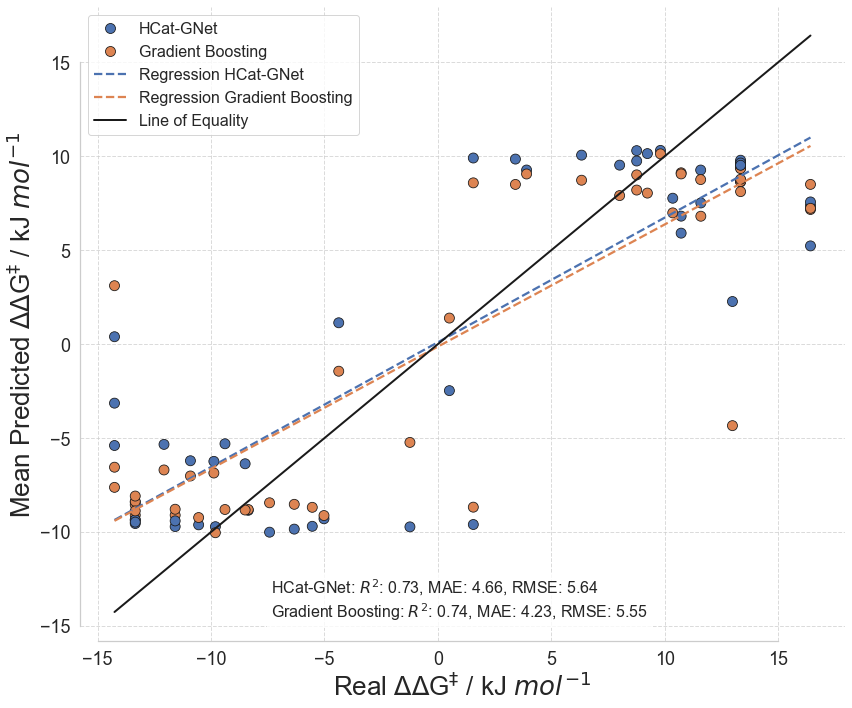

In [28]:
plot_mean_predictions(results)

## Training HCat-GNet using part of the "unseen" ligand data

To perform this experiments, we randomly took some samples from the 'unseen' ligand data and included them into the 'seen' or learning data. By performing this experiment, we aimed to evaluate how the predictions of the model on the new ligand family changed when seeing some of this samples. A dataset with half of the 'unseen' samples included in the 'seen' data is available in `data/datasets/rhcaa/halftest/learning/raw/rhcaa_half.csv`, while the half of data points excluded is available in `data/datasets/rhcaa/halftest/test/raw/rhcaa_half_test.csv`. Lastly, a dataset containing all the combined data is available in `data/datasets/rhcaa/all_combined/raw/rhcaa_all.csv`. We will use this files to replicate the Figure 8 in the paper.

### Including half of the unseen set into the learning data

We define the variables that are useful to find our data.

In [29]:
root = Path("data") / "datasets" / "rhcaa" / "halftest" / "learning"
filename = "rhcaa_half.csv"

We create a molecular graph dataset from which the GNN will learn correlations.

In [30]:
dataset = rhcaa_diene(
    filename=filename,
    root=root,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=folds,
    random_seed=global_seed,
)

We define the path where we wish to store the results.

In [31]:
dir_results = Path("TRIAL") / f"{dataset._name}_half" / "learning"
dir_results_GNN = dir_results / "results_GNN"

Then, we run the GNN training as done before.

In [32]:
train_network_nested_cv(
    graph_dataset=dataset,
    log_results_dir=dir_results_GNN,
    folds=folds,
    global_seed=global_seed,
)

Initialising chiral diene ligands experiment using early stopping
Using device: cpu
1/90-Epoch 000 | Train loss: 7.402 kJ/mol | Validation loss: 6.227 kJ/mol | Test loss: 5.053 kJ/mol
New best validation loss: 6.2265 found at epoch 0
1/90-Epoch 001 | Train loss: 5.223 kJ/mol | Validation loss: 6.298 kJ/mol | Test loss: 5.256 kJ/mol
1/90-Epoch 002 | Train loss: 5.052 kJ/mol | Validation loss: 6.177 kJ/mol | Test loss: 5.003 kJ/mol
1/90-Epoch 003 | Train loss: 4.802 kJ/mol | Validation loss: 6.219 kJ/mol | Test loss: 5.058 kJ/mol
1/90-Epoch 004 | Train loss: 4.821 kJ/mol | Validation loss: 6.443 kJ/mol | Test loss: 5.377 kJ/mol
1/90-Epoch 005 | Train loss: 4.812 kJ/mol | Validation loss: 6.084 kJ/mol | Test loss: 5.089 kJ/mol
New best validation loss: 6.0835 found at epoch 5
1/90-Epoch 006 | Train loss: 4.648 kJ/mol | Validation loss: 5.696 kJ/mol | Test loss: 4.794 kJ/mol
1/90-Epoch 007 | Train loss: 4.511 kJ/mol | Validation loss: 5.871 kJ/mol | Test loss: 5.010 kJ/mol
1/90-Epoch 008 |

Then, the csv with the data is loaded to train the TML methods.

In [33]:
data = pd.read_csv(root / "raw" / dataset.filename)
data.sample(10, random_state=global_seed)

,Unnamed: 0,index,%top,ddG,Ligand,ER1,ER2,ER3,ER4,ER5,...,mol% Rh,mol% ligand,solvent,substrate,temp,time,yield,Confg,category,fold
299,299,299,96.00,9.860089,OC(C)(C)C1=C[C@@H]2C(C)=C[C@H]1[C@@H](C(C)C)C2,0.00,0.00,0.00,-0.17,0.00,...,1.500,2.00,toluene/H2O,C/C=C/C(C1=CC=CC=C1)=O,100,12.0,72.0,2,1,2
475,475,475,98.00,9.485906,C1(C2=CC=CC=C2)=C[C@H]3C(C4=CC=CC=C4)=C[C@@H]1CC3,0.00,0.00,-0.01,0.00,0.00,...,1.500,3.30,dioxane,O=C(/C(C#N)=C/C1=CC=CC=C1)OC,20,1.0,96.0,1,1,2
486,486,486,99.00,11.200125,C1(C2=CC=CC=C2)=C[C@H]3C(C4=CC=CC=C4)=C[C@@H]1CC3,0.00,0.00,-0.01,0.00,0.00,...,1.500,3.30,dioxane,O=C(/C(C#N)=C/C1=CC=C(C=CC=C2)C2=C1)OC,20,1.0,91.0,1,1,1
74,74,74,2.75,-8.839217,CC1(C)[C@H]2C(C3=C(C=CC=C4)C4=CC=C3)=C[C@]1(C)...,0.14,-0.17,0.00,0.14,0.00,...,0.025,0.06,EtOH,CC(/C=C/C1CCCC1)=O,25,16.0,99.0,2,0,1
155,155,155,1.00,-12.728370,C1(C2=CC=CC=C2)=C[C@@H]3C(C4=CC=CC=C4)=C[C@H]1CC3,-0.01,0.00,0.00,-0.01,0.00,...,2.500,5.50,dioxane/H2O,O=C1C=CC(N1c2c(C(C)(C)C)cccc2)=O,60,5.0,97.0,2,0,3
671,671,671,0.50,-13.341990,O=C1N(CCC)[C@@]23C=C(C4=CC=CC=C4)[C@H](CC3=C1)...,0.41,-0.93,0.00,-0.01,0.00,...,1.500,3.50,dioxane/H2O,O=C1C=CCCC1,30,5.0,98.0,2,0,7
666,666,666,85.00,5.670143,O=C(C1=C[C@H]2C(C)=C[C@@H]1[C@H](C2)C(C)C)N3CC...,0.00,0.00,0.36,0.00,0.00,...,2.500,6.00,dioxane/H2O,O=[N+](C1=CC=C(/C=C/CCC2=CC=CC=C2)C=C1)[O-],120,0.5,76.0,1,1,8
668,668,668,1.00,-11.582186,BrC1=C[C@]2(N3CCC)C(C(N[C@@H](C4=CC=CC5=C4C=CC...,0.41,-0.93,0.00,0.23,0.00,...,1.500,3.50,dioxane/H2O,O=C1C=CCCC1,30,5.0,51.0,2,0,1
200,200,200,0.50,-13.121934,C[C@]1(CC2)C(C3=CC=CC=C3)=C[C@]2(C)C(C4=CC=CC=...,-0.01,-0.17,0.00,-0.01,-0.17,...,1.500,3.30,MeOH/CH2Cl2,O=C(N1CC2=CC=CC=C2)C=CC1=O,25,1.0,98.0,2,0,1
499,499,499,96.00,7.878294,O=C(C1=CC=C(C2=C[C@H]3C(C4=CC=C(C=C4)C(OC)=O)=...,0.00,0.00,0.04,0.00,0.00,...,1.500,3.30,dioxane/H2O,CC(/C=C/CCCCC)=O,25,3.0,99.0,1,1,4


We filter the columns of the csv to retain only those useful for training.

In [34]:
data = data[descriptors + [target_variable, "fold", "index"]]
data.sample(10, random_state=global_seed)

,LVR1,LVR2,LVR3,LVR4,LVR5,LVR6,LVR7,VB,ER1,ER2,...,ER6,ER7,SStoutR1,SStoutR2,SStoutR3,SStoutR4,temp,ddG,fold,index
299,64.956412,0.000000,0.000000,21.574215,0.000000,0.000000,84.579926,134.623998,0.00,0.00,...,0.00,-0.15,20.067612,0.000000,21.574215,0.000000,100,9.860089,2,299
475,0.000000,0.000000,76.888305,0.000000,0.000000,76.888305,32.691970,153.907618,0.00,0.00,...,-0.01,0.00,17.938065,0.000000,19.222076,13.649029,20,9.485906,2,475
486,0.000000,0.000000,76.888305,0.000000,0.000000,76.888305,32.691970,134.623998,0.00,0.00,...,-0.01,0.00,17.938065,0.000000,19.590478,13.649029,20,11.200125,1,486
74,117.542869,21.574215,0.000000,117.542869,0.000000,0.000000,54.847956,149.835066,0.14,-0.17,...,0.00,-0.17,22.511984,0.000000,26.133899,0.000000,25,-8.839217,1,74
155,76.888305,0.000000,0.000000,76.888305,0.000000,0.000000,32.691970,151.919984,-0.01,0.00,...,0.00,0.00,30.086460,13.863991,0.000000,0.000000,60,-12.728370,3,155
671,189.540000,92.250000,0.000000,76.888305,0.000000,0.000000,77.300000,134.623998,0.41,-0.93,...,0.00,-0.16,22.511984,19.435100,0.000000,0.000000,30,-13.341990,7,671
666,0.000000,0.000000,104.342452,0.000000,0.000000,21.574215,84.579926,134.623998,0.00,0.00,...,-0.17,-0.15,17.138177,0.000000,18.580046,0.000000,120,5.670143,8,666
668,189.540000,92.250000,0.000000,26.520000,0.000000,0.000000,77.300000,134.623998,0.41,-0.93,...,0.00,-0.16,22.511984,19.435100,0.000000,0.000000,30,-11.582186,1,668
200,76.888305,21.574215,0.000000,76.888305,21.574215,0.000000,32.691970,201.364775,-0.01,-0.17,...,0.00,0.00,18.375829,13.863991,0.000000,0.000000,25,-13.121934,1,200
499,0.000000,0.000000,126.424270,0.000000,0.000000,126.424270,32.691970,134.623998,0.00,0.00,...,0.00,0.00,22.511984,0.000000,18.151631,0.000000,25,7.878294,4,499


Then, we run the TML model training

In [35]:
train_tml_model_nested_cv(
    data_csv=data,
    mol_cols=mol_cols,
    descriptors=descriptors,
    target_variable=target_variable,
    log_results_dir=dir_results_TML("gb", "bespoke"),
    tml_algorithm="gb",
    global_seed=global_seed,
)

Initialising chiral ligands selectivity prediction using a traditional ML approach.
Number of splits: 10
Total number of runs: 90
Hyperparameter optimisation starting...
Features shape:  (694, 20)
Y target variable shape:  (694,)
ML algorithm to be tunned: GradientBoostingRegressor()
Fitting 3 folds for each of 144 candidates, totalling 432 fits
Best hyperparameters: {'learning_rate': 0.2, 'loss': 'squared_error', 'max_depth': 25, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 300, 'random_state': 20232023} 

Hyperparameter optimisation has finalised
Training starting...
********************************
Outer: 1 | Inner: 2 | Run 1/90 | Train RMSE 0.074 kJ/mol | Val RMSE 3.886 kJ/mol | Test RMSE 2.732 kJ/mol
Outer: 1 | Inner: 3 | Run 2/90 | Train RMSE 0.147 kJ/mol | Val RMSE 3.412 kJ/mol | Test RMSE 3.614 kJ/mol
Outer: 1 | Inner: 4 | Run 3/90 | Train RMSE 0.151 kJ/mol | Val RMSE 3.106 kJ/mol | Test RMSE 3.694 kJ/mol
Outer: 1 | Inner: 5 | Run 4/90 | Train RMSE 0.144 kJ/mo

To compare the results, we use the `plot_results` function again.

In [36]:
plot_results(
    save_dir=comparison_path_generator(dir_results, "gb", "bespoke"),
    experiments_gnn_path=dir_results_GNN,
    experiments_tml_path=dir_results_TML("gb", "bespoke"),
    tml_algorithm="gb",
)

Plot MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/learning/comparison/GNN_vs_gb/bespoke
CSV for MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/learning/comparison/GNN_vs_gb/bespoke
Plot RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/learning/comparison/GNN_vs_gb/bespoke
CSV for RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/learning/comparison/GNN_vs_gb/bespoke
Plot R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/learning/comparison/GNN_vs_gb/bespoke
CSV for R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/learning/comparison/GNN_vs_gb/bespoke
Plot Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/learning/comparison/GNN_vs_gb/bespoke
CSV for Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/learning/comparison/GNN_vs_gb/bespoke
Plot Precision_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_dien

Now, we load the other half test data to make predictions

In [37]:
root_test = Path("data") / "datasets" / "rhcaa" / "halftest" / "test"
filename_test = "rhcaa_half_test.csv"
dir_results_test = Path("TRIAL") / f"{dataset._name}_half" / "test"

We create the molecular graph dataset.

In [38]:
test_graph_dataset = rhcaa_diene(
    filename=filename_test,
    root=root_test,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=None,
)

Read the csv containing the unseen set.

In [39]:
test_dataset = pd.read_csv(root_test / "raw" / filename_test)
test_dataset = test_dataset[descriptors + [target_variable, "index"]]
test_dataset.sample(10, random_state=global_seed)

,LVR1,LVR2,LVR3,LVR4,LVR5,LVR6,LVR7,VB,ER1,ER2,...,ER5,ER6,ER7,SStoutR1,SStoutR2,SStoutR3,SStoutR4,temp,ddG,index
2,0.00,92.25,189.54,0.000000,0,111.480276,77.3,134.623998,0.00,-0.93,...,0,-0.09,-0.16,22.511984,19.4351,0.000000,0.000000,30,13.341990,15
3,0.00,92.25,189.54,0.000000,0,129.060729,77.3,134.623998,0.00,-0.93,...,0,0.00,-0.16,22.511984,19.4351,0.000000,0.000000,30,13.341990,16
12,0.00,92.25,189.54,0.000000,0,21.574215,77.3,151.919984,0.00,-0.93,...,0,-0.17,-0.16,15.109493,0.0000,0.000000,19.222076,100,16.422773,25
6,0.00,92.25,189.54,0.000000,0,21.574215,77.3,134.623998,0.00,-0.93,...,0,-0.17,-0.16,26.425538,0.0000,21.574215,0.000000,35,10.721397,19
25,0.00,34.21,148.89,0.000000,0,120.500000,77.3,134.623998,0.00,-0.93,...,0,0.14,-0.16,22.511984,19.4351,0.000000,0.000000,30,8.761648,38
1,0.00,92.25,189.54,0.000000,0,105.930000,77.3,134.623998,0.00,-0.93,...,0,-0.03,-0.16,22.511984,19.4351,0.000000,0.000000,30,13.341990,14
18,0.00,92.25,189.54,0.000000,0,21.574215,77.3,151.919984,0.00,-0.93,...,0,-0.17,-0.16,22.205000,0.0000,0.000000,19.222076,100,16.422773,31
22,0.00,34.21,148.89,0.000000,0,24.530000,77.3,134.623998,0.00,-0.93,...,0,-0.17,-0.16,22.511984,19.4351,0.000000,0.000000,30,6.332369,35
19,189.54,92.25,0.00,76.888305,0,0.000000,77.3,151.919984,0.41,-0.93,...,0,0.00,-0.16,22.205000,0.0000,0.000000,19.222076,100,-12.074589,32
15,189.54,92.25,0.00,117.542869,0,0.000000,77.3,134.623998,0.41,-0.93,...,0,0.00,-0.16,21.580000,0.0000,0.000000,19.355000,85,-10.909494,28


Create the paths to store results.

In [40]:
dir_results_GNN_test = dir_results_test / "results_GNN"

Make predictions on the unseen set.

In [41]:
predict_final_test(
    graph_dataset=test_graph_dataset,
    handcrafted_descriptors_dataset=test_dataset,
    descriptors=descriptors,
    GNN_experiment_path=dir_results_GNN,
    TML_experiment_path=dir_results_TML("gb", "bespoke"),
    GNN_log_dir=dir_results_GNN_test,
    TML_log_dir=dir_results_TML_test("gb", "bespoke"),
)

Analysing models trained using as test set 1
Analysing models trained using as validation set 2
Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validation set 10
Analysing models trained using as test set 2
Analysing models trained using as validation set 1
Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validati

We then compare the results of approaches.

In [42]:
plot_results(
    save_dir=comparison_path_generator(dir_results_test, "gb", "bespoke"),
    experiments_gnn_path=dir_results_GNN_test,
    experiments_tml_path=dir_results_TML_test("gb", "bespoke"),
    tml_algorithm="gb",
)

Plot MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb/bespoke
CSV for MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb/bespoke
Plot RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb/bespoke
CSV for RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb/bespoke
Plot R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb/bespoke
CSV for R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb/bespoke
Plot Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb/bespoke
CSV for Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb/bespoke
Plot Precision_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb

/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:81: RuntimeWarning: invalid value encountered in scalar divide
  t_stat = (mean_gnn[i] - mean_tml[i]) / se_diff
/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:82: RuntimeWarning: invalid value encountered in scalar divide
  df = (se_gnn**2 + se_tml**2) ** 2 / (


All plots have been saved in the directory TRIAL/rhcaa_diene_half/test/comparison/GNN_vs_gb/bespoke


Final metrics for GNN:
Accuracy: 0.979
Precision: 0.981
Recall: 0.987
R2: 0.753
MAE: 4.135
RMSE: 5.635 

Final metrics for gb:
Accuracy: 0.950
Precision: 0.962
Recall: 0.961
R2: 0.712
MAE: 4.099
RMSE: 6.090 



Now, we can analyse the results and get a parity plot.

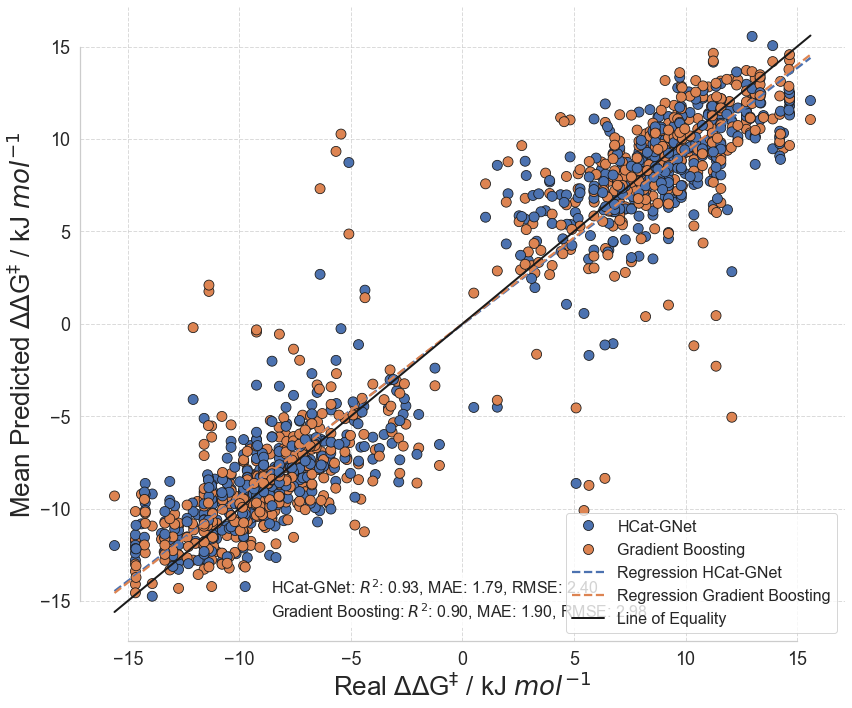

In [43]:
results_seen = pd.read_csv(
    comparison_path_generator(dir_results, "gb", "bespoke") / "predictions_all.csv"
)
plot_mean_predictions(results_seen)

For the unseen set, it can be done as shown.

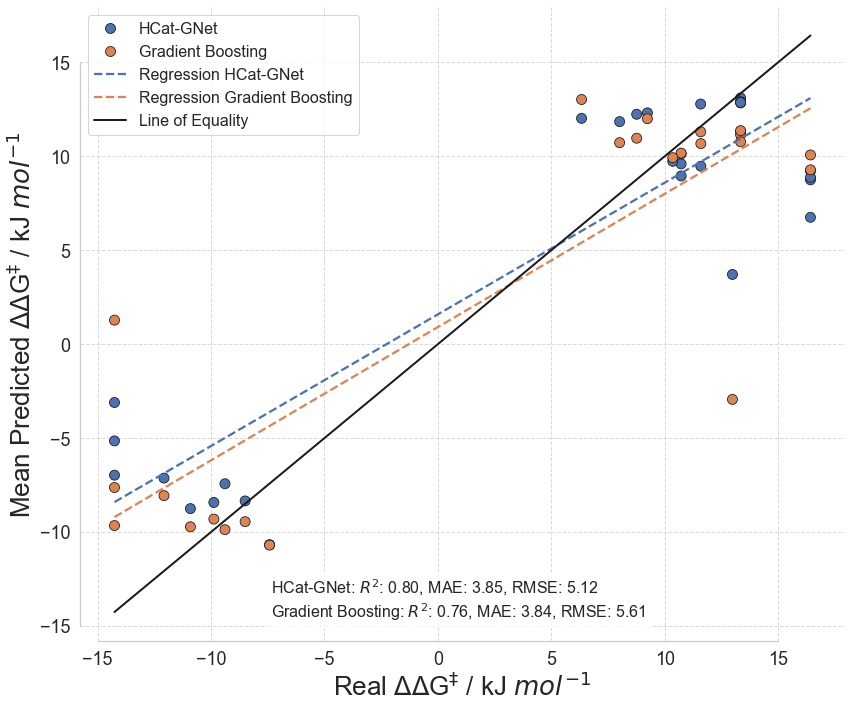

In [44]:
results_unseen = pd.read_csv(
    comparison_path_generator(dir_results_test, "gb", "bespoke") / "predictions_all.csv"
)
plot_mean_predictions(results_unseen)

However, in the paper, we present the parity plot of all the reactions that belong to the original unseen set. To do that, we can use the following code.

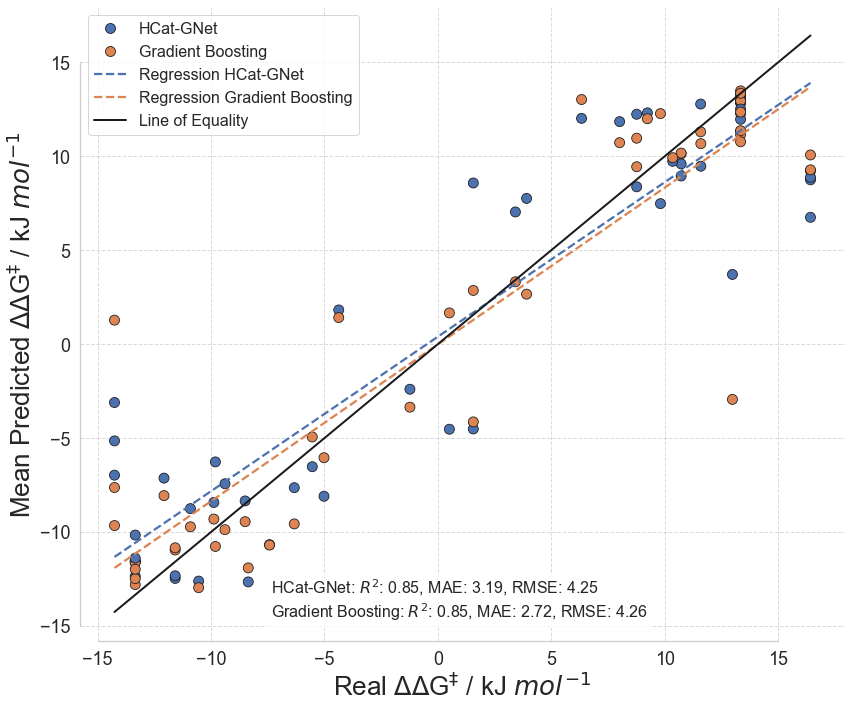

In [45]:
results_unseen_all = pd.concat(
    [results_seen.loc[results_seen["index"] > 667], results_unseen]
)
plot_mean_predictions(results_unseen_all)

### Including all the unseen set into the learning data

In [46]:
root = Path("data") / "datasets" / "rhcaa" / "all_combined" / "learning"
filename = "rhcaa_all.csv"

In [47]:
dataset = rhcaa_diene(
    filename=filename,
    root=root,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=folds,
    random_seed=global_seed,
)

In [48]:
dir_results = Path("TRIAL") / f"{dataset._name}_all"

In [49]:
dir_results_GNN = dir_results / "results_GNN"

In [50]:
train_network_nested_cv(
    graph_dataset=dataset,
    log_results_dir=dir_results_GNN,
    folds=folds,
    global_seed=global_seed,
)

Initialising chiral diene ligands experiment using early stopping
Using device: cpu
1/90-Epoch 000 | Train loss: 7.432 kJ/mol | Validation loss: 4.996 kJ/mol | Test loss: 7.203 kJ/mol
New best validation loss: 4.9961 found at epoch 0
1/90-Epoch 001 | Train loss: 5.002 kJ/mol | Validation loss: 5.152 kJ/mol | Test loss: 6.723 kJ/mol
1/90-Epoch 002 | Train loss: 4.894 kJ/mol | Validation loss: 4.956 kJ/mol | Test loss: 6.410 kJ/mol
1/90-Epoch 003 | Train loss: 4.752 kJ/mol | Validation loss: 4.789 kJ/mol | Test loss: 6.501 kJ/mol
1/90-Epoch 004 | Train loss: 4.731 kJ/mol | Validation loss: 4.840 kJ/mol | Test loss: 6.386 kJ/mol
1/90-Epoch 005 | Train loss: 4.606 kJ/mol | Validation loss: 5.042 kJ/mol | Test loss: 6.225 kJ/mol
1/90-Epoch 006 | Train loss: 4.725 kJ/mol | Validation loss: 5.028 kJ/mol | Test loss: 6.428 kJ/mol
1/90-Epoch 007 | Train loss: 4.648 kJ/mol | Validation loss: 4.757 kJ/mol | Test loss: 6.431 kJ/mol
1/90-Epoch 008 | Train loss: 4.508 kJ/mol | Validation loss: 4.704

Now, load the dataset with descriptors to train TML models.

In [51]:
data = pd.read_csv(root / "raw" / dataset.filename)
data.sample(10, random_state=global_seed)

,Unnamed: 0,index,%top,ddG,Ligand,ER1,ER2,ER3,ER4,ER5,...,mol% Rh,mol% ligand,solvent,substrate,temp,time,yield,Confg,category,fold
438,438,438,95.00,7.911209,CC1=C(CC2=C[C@H]3C(CC4=C(C=C(C=C4C)C)C)=C[C@@H...,0.00,0.00,-0.09,0.00,0.00,...,2.500,5.50,dioxane/H2O,O=C(/C=C/C(OC(C)(C)C)=O)OC(C)(C)C,50,3.00,85.0,1,1,9
677,677,677,99.50,13.341990,BrC1=C[C@@]2(N3CCC)C(C(N[C@H](C)C4=C(C=CC=C5)C...,0.00,-0.93,0.41,0.00,0.00,...,1.500,3.50,dioxane/H2O,O=C1C=CCCC1,30,5.00,67.0,1,1,9
495,495,495,99.50,14.662326,C1(C2=CC=CC=C2)=C[C@H]3C(C4=CC=CC=C4)=C[C@@H]1CC3,0.00,0.00,-0.01,0.00,0.00,...,2.500,5.50,dioxane/H2O,O=C1C=CC(N1c2c(C(COC)(C)C)cccc2)=O,60,5.00,96.0,1,1,2
533,533,533,99.50,13.121934,C[C@@]12CC[C@](C)(C(C3=CC=CC=C3)=C2)C=C1C4=CC=...,0.00,-0.17,-0.01,0.00,-0.17,...,1.500,3.30,MeOH/CH2Cl2,O=C(N1CC2=CC=CC=C2)C=CC1=O,25,1.00,92.0,1,1,3
252,252,252,98.50,11.243289,C=CCC1=C[C@]2(C)C(CC(C)C)=C[C@H]1[C@@](OC)(C)C2,0.07,0.00,0.00,-0.12,-0.17,...,1.500,3.30,dioxane/water,O=C1CCCC=C1,50,1.00,96.0,2,1,0
680,680,680,99.50,13.341990,O=C(N[C@H](C)C1=C(C=CC=C2)C2=CC=C1)C3=C[C@H](C...,0.00,-0.93,0.41,0.00,0.00,...,1.500,3.50,dioxane/H2O,O=C1C=CCCC1,30,5.00,98.0,1,1,3
258,258,258,96.50,8.911626,CC(C)CC1=C[C@H]2C(CC3=CC=CC=C3)=C[C@]1(C)C[C@]...,0.00,0.00,-0.09,0.00,-0.17,...,1.500,3.30,MeOH/H2O,[H]C(/C=C/C1=CC=CO1)=O,50,1.25,63.0,1,1,9
74,74,74,2.75,-8.839217,CC1(C)[C@H]2C(C3=C(C=CC=C4)C4=CC=C3)=C[C@]1(C)...,0.14,-0.17,0.00,0.14,0.00,...,0.025,0.06,EtOH,CC(/C=C/C1CCCC1)=O,25,16.00,99.0,2,0,1
176,176,176,7.00,-6.949996,C1(CC2=CC=CC=C2)=C[C@@H]3C(CC4=CC=CC=C4)=C[C@H...,-0.09,0.00,0.00,-0.09,0.00,...,1.500,3.30,dioxane,O=C1C=CCC1,50,1.00,94.0,2,0,9
457,457,457,96.00,8.538893,C1(C2=CC=CC=C2)=C[C@H]3C(C4=CC=CC=C4)=C[C@@H]1CC3,0.00,0.00,-0.01,0.00,0.00,...,1.500,3.30,dioxane/H2O,O=C1C=CCCCC1,50,1.00,95.0,1,1,2


Clean the database.

In [52]:
data = data[descriptors + [target_variable, "fold", "index"]]
data.sample(10, random_state=global_seed)

,LVR1,LVR2,LVR3,LVR4,LVR5,LVR6,LVR7,VB,ER1,ER2,...,ER6,ER7,SStoutR1,SStoutR2,SStoutR3,SStoutR4,temp,ddG,fold,index
438,0.000000,0.000000,146.072246,0.000000,0.000000,146.072246,20.255985,140.691557,0.00,0.00,...,-0.09,0.00,26.425538,0.000000,26.425538,0.0,50,7.911209,9,438
677,0.000000,92.250000,189.540000,0.000000,0.000000,26.520000,77.300000,134.623998,0.00,-0.93,...,0.23,-0.16,22.511984,19.435100,0.000000,0.0,30,13.341990,9,677
495,0.000000,0.000000,76.888305,0.000000,0.000000,76.888305,32.691970,134.623998,0.00,0.00,...,-0.01,0.00,25.825621,13.863991,0.000000,0.0,60,14.662326,2,495
533,0.000000,21.574215,76.888305,0.000000,21.574215,76.888305,32.691970,160.710210,0.00,-0.17,...,-0.01,0.00,18.375829,13.863991,0.000000,0.0,25,13.121934,3,533
252,36.233741,0.000000,0.000000,73.462170,21.574215,0.000000,76.074168,175.369737,0.07,0.00,...,0.00,-0.27,22.511984,19.435100,0.000000,0.0,50,11.243289,0,252
680,0.000000,92.250000,189.540000,0.000000,0.000000,76.888305,77.300000,134.623998,0.00,-0.93,...,-0.01,-0.16,22.511984,19.435100,0.000000,0.0,30,13.341990,3,680
258,0.000000,0.000000,94.184290,0.000000,21.574215,73.462170,76.074168,134.623998,0.00,0.00,...,-0.12,-0.27,27.727983,0.000000,17.907673,0.0,50,8.911626,9,258
74,117.542869,21.574215,0.000000,117.542869,0.000000,0.000000,54.847956,149.835066,0.14,-0.17,...,0.00,-0.17,22.511984,0.000000,26.133899,0.0,25,-8.839217,1,74
176,94.184290,0.000000,0.000000,94.184290,0.000000,0.000000,32.691970,134.623998,-0.09,0.00,...,0.00,0.00,22.511984,21.574215,0.000000,0.0,50,-6.949996,9,176
457,0.000000,0.000000,76.888305,0.000000,0.000000,76.888305,32.691970,134.623998,0.00,0.00,...,-0.01,0.00,22.511984,18.722062,0.000000,0.0,50,8.538893,2,457


In [53]:
train_tml_model_nested_cv(
    data_csv=data,
    mol_cols=mol_cols,
    descriptors=descriptors,
    target_variable=target_variable,
    log_results_dir=dir_results_TML("gb", "bespoke"),
    tml_algorithm="gb",
    global_seed=global_seed,
)

Initialising chiral ligands selectivity prediction using a traditional ML approach.
Number of splits: 10
Total number of runs: 90
Hyperparameter optimisation starting...
Features shape:  (720, 20)
Y target variable shape:  (720,)
ML algorithm to be tunned: GradientBoostingRegressor()
Fitting 3 folds for each of 144 candidates, totalling 432 fits
Best hyperparameters: {'learning_rate': 0.1, 'loss': 'squared_error', 'max_depth': 8, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 20232023} 

Hyperparameter optimisation has finalised
Training starting...
********************************
Outer: 1 | Inner: 2 | Run 1/90 | Train RMSE 0.578 kJ/mol | Val RMSE 3.499 kJ/mol | Test RMSE 4.052 kJ/mol
Outer: 1 | Inner: 3 | Run 2/90 | Train RMSE 0.538 kJ/mol | Val RMSE 3.436 kJ/mol | Test RMSE 3.766 kJ/mol
Outer: 1 | Inner: 4 | Run 3/90 | Train RMSE 0.535 kJ/mol | Val RMSE 2.275 kJ/mol | Test RMSE 4.249 kJ/mol
Outer: 1 | Inner: 5 | Run 4/90 | Train RMSE 0.629 kJ/mol

We now compare results.

In [54]:
plot_results(
    save_dir=comparison_path_generator(dir_results, "gb", "bespoke"),
    experiments_gnn_path=dir_results_GNN,
    experiments_tml_path=dir_results_TML("gb", "bespoke"),
    tml_algorithm="gb",
)

Plot MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_all/comparison/GNN_vs_gb/bespoke
CSV for MAE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_all/comparison/GNN_vs_gb/bespoke
Plot RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_all/comparison/GNN_vs_gb/bespoke
CSV for RMSE_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_all/comparison/GNN_vs_gb/bespoke
Plot R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_all/comparison/GNN_vs_gb/bespoke
CSV for R2_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_all/comparison/GNN_vs_gb/bespoke
Plot Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_all/comparison/GNN_vs_gb/bespoke
CSV for Accuracy_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_all/comparison/GNN_vs_gb/bespoke
Plot Precision_GNN_vs_TML has been saved in the directory TRIAL/rhcaa_diene_all/comparison/GNN_vs_gb/bespoke
CSV for Precision_GNN_vs_TML has been saved i

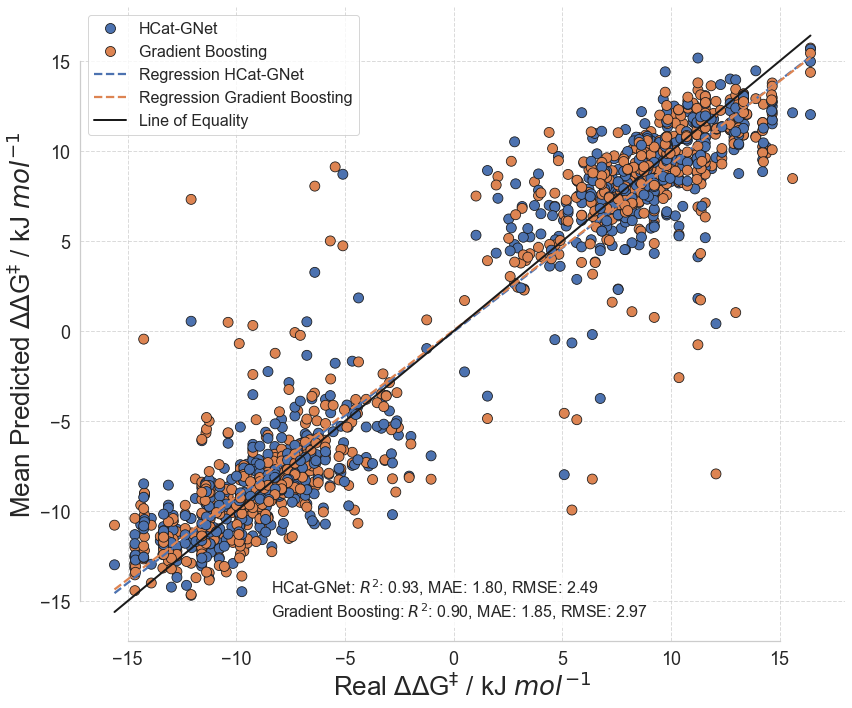

In [55]:
results_all = pd.read_csv(
    comparison_path_generator(dir_results, "gb", "bespoke") / "predictions_all.csv"
)
plot_mean_predictions(results_all)

And now we filter to only get the reactions that belong to the original unseen set.

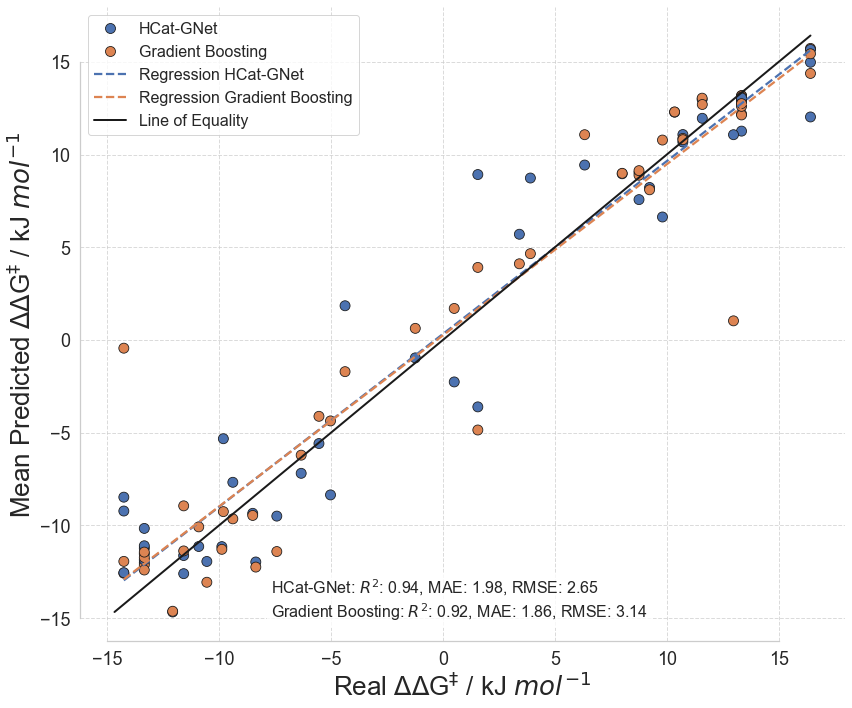

In [56]:
plot_mean_predictions(results_all.loc[results_all["index"] > 667])

## Runing Interpretations

As shown in the main paper, our tool allows to interpret the GNN models trained. We are going to demonstrate how to get such intepretations using code. First, import the necessary functions.

In [57]:
from hcatgnet.gnn_interpretation.mol_denoiser import (
    denoise_mol,
    explain_node_feats,
    shapley_analysis,
)
import torch

For the paper, we randomly selected one of the models to make all the explanation plots shown using a random number generator. Those numbers led to analyse the model correspoding to the outer fold 8, inner fold 10 model. We create the path to load the model, loaders, and other data from such run.

In [58]:
test_fold = 8
val_fold = 10

model_path = (
    Path("TRIAL")
    / "rhcaa_diene"
    / "learning"
    / "results_GNN"
    / f"Fold_{test_fold}_test_set"
    / f"Fold_{val_fold}_val_set"
)

Now, we load the previously trained model using the code bellow.

In [59]:
model = torch.load(model_path / "model.pth", weights_only=False)
params = torch.load(model_path / "model_params.pth", weights_only=True)
model.load_state_dict(params)

<All keys matched successfully>

To replicate Figure 9 in the main paper, we ran a GNNExplainer algorithm using the model we loaded before on the test set of such run. To replicate it, we first load our molecular graph test dataset.

In [60]:
test_dataset = torch.load(model_path / "test_loader.pth").dataset

Lastly, we use the `explain_node_feats` function, which expects the model and the data for which we want to run the analysis.

ligand node features score: 
                        score                 labels
Ligand Confg.       1686.875       L. Ligand Confg.
Atom Degree         1678.823         L. Atom Degree
Atom Hybridization  1671.620  L. Atom Hybridization
Atomic Identity     1584.665     L. Atomic Identity
Atom in Ring         627.632        L. Atom in Ring
Atom Aromaticity     344.541    L. Atom Aromaticity
Atom Chirality        90.048      L. Atom Chirality
substrate node features score: 
                       score                 labels
Atomic Identity     779.140     S. Atomic Identity
Atom Degree         761.619         S. Atom Degree
Atom Hybridization  754.924  S. Atom Hybridization
Atom in Ring        182.653        S. Atom in Ring
Atom Aromaticity     85.886    S. Atom Aromaticity
boronreagent node features score: 
                       score                 labels
Atomic Identity     646.668     B. Atomic Identity
Atom Hybridization  634.736  B. Atom Hybridization
Atom Degree         627.57

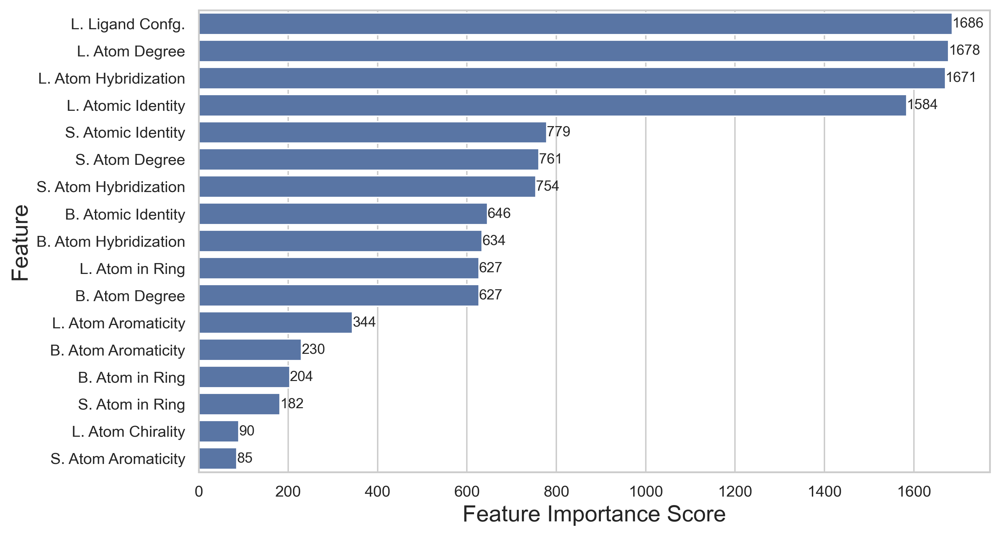

In [61]:
explain_node_feats(
    model=model,
    dataset=test_dataset,
    include_Hs=include_Hs,
    feature_sizes=dataset.atom_feats_length,
)

To recreate figure 10, we make use of the function `denoise_mol`. This function relies on GNNExplainer to assign a score to each node feature within each node. Then, we assign such score a value of transparency an it is mapped to the molecule. The result is a plot of the molecule with atoms with transparecy values based on how important is a certain property in that specific node. The arguments that this function expect are:
- `model` is the model to be explained.
- `mol_dataset` is the molecular graph dataset to use to get the explanations from.
- `mol_index` is the index of the molecule/reaction within the dataset to plot.
- `denoise_mol` is which one of the molecules used in the molecular graph representation to plot.
- `include_Hs` is whether or not explicit hydrogens were used to build the molecular graph representations.
- `analyse_feature` is a parameter to allow get the importance from a specific type of node feature. For the case of our dataset, the allowed options are:
    - "Atomic Identity"
    - "Atom Degree"
    - "Atom Hybridization"
    - "Atom Aromaticity"
    - "Atom in Ring"
    - "Atom Chirality"
    - "Ligand Confg."
- `norm_denoise` is whether or not to normalise the scores between 0 and 1.


In [62]:
for feat in dataset.atom_feats_length.keys():

    if feat:
        print("Explaining feature:", feat)

    denoise_mol(
        model=model,
        mol_dataset=dataset,
        mol_index=1,
        denoise_mol="Ligand",
        analyse_feature=feat,
        include_Hs=include_Hs,
    )

Explaining feature: Atomic Identity


Explaining feature: Atom Degree


Explaining feature: Atom Hybridization


Explaining feature: Atom Aromaticity


Explaining feature: Atom in Ring


Explaining feature: Atom Chirality


Explaining feature: Ligand Confg.


Lastly, with the `shapley_analysis` function we can compute scores using Shapley Value Sampling. This function expects the model to be explained, the dataset where the molecule that wants to be exlained is, the index of the molecule to explain, and the name of the molecule to plot.

In [63]:
explain_mols = [82, 416, 89, 91, 95, 97]

for mol in explain_mols:
    shapley_analysis(model=model, dataset=dataset, explain_mol=mol, plot_mol="ligand")

Reaction ddG: 7.30
Reaction predicted ddG: 7.94
ligand
CO[C@]1(C)C[C@@]2(C)C=C[C@@H]1C=C2c1ccccc1


Reaction ddG: -7.30
Reaction predicted ddG: -8.28
ligand
CO[C@]1(C)C[C@]2(C)C=C[C@H]1C=C2c1ccccc1


Reaction ddG: 9.19
Reaction predicted ddG: 7.33
ligand
CO[C@]1(C)C[C@@]2(C)C=C[C@@H]1C=C2c1ccc(C)cc1


Reaction ddG: 7.57
Reaction predicted ddG: 7.06
ligand
CO[C@]1(C)C[C@@]2(C)C=C[C@@H]1C=C2c1ccc(C(C)(C)C)cc1


Reaction ddG: 7.57
Reaction predicted ddG: 7.38
ligand
COc1ccc(C2=C[C@H]3C=C[C@]2(C)C[C@@]3(C)OC)cc1


Reaction ddG: 7.05
Reaction predicted ddG: 7.52
ligand
CO[C@]1(C)C[C@@]2(C)C=C[C@@H]1C=C2c1ccc(C(F)(F)F)cc1


## Evaluation of HCat-GNet on Other Asymmetric Reactions

### The RhCAA BiAryl Dataset

The `rhcaa_biaryl` class will be useful to create the graph representation for this dataset.

In [64]:
from data.biaryl import rhcaa_biaryl

Then, we define the variables that allow the creation of the graph dataset.

In [65]:
filename = "biaryl.csv"
root = Path("data") / "datasets" / "biAryl" / "learning"
mol_cols = ["Ligand", "substrate", "boron reagent"]

The `rhcaa_biaryl` dataset expects the same inputs of `rhcaa_diene` that we explained before.

In [66]:
dataset = rhcaa_biaryl(
    filename=filename,
    root=root,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=folds,
    random_seed=global_seed,
)

Define the directories to save the results.

In [67]:
dir_results = Path("TRIAL") / dataset._name / "learning"
dir_results_GNN = dir_results / "results_GNN"

Train the GNN model using the `train_network_nested_cv` function.

In [68]:
train_network_nested_cv(
    graph_dataset=dataset,
    log_results_dir=dir_results_GNN,
    folds=folds,
    global_seed=global_seed,
)

Initialising chiral diene ligands experiment using early stopping
Using device: cpu
1/90-Epoch 000 | Train loss: 9.781 kJ/mol | Validation loss: 8.096 kJ/mol | Test loss: 8.572 kJ/mol
New best validation loss: 8.0959 found at epoch 0
1/90-Epoch 001 | Train loss: 6.274 kJ/mol | Validation loss: 3.853 kJ/mol | Test loss: 5.594 kJ/mol
1/90-Epoch 002 | Train loss: 5.140 kJ/mol | Validation loss: 4.613 kJ/mol | Test loss: 6.018 kJ/mol
1/90-Epoch 003 | Train loss: 4.788 kJ/mol | Validation loss: 4.445 kJ/mol | Test loss: 5.722 kJ/mol
1/90-Epoch 004 | Train loss: 4.399 kJ/mol | Validation loss: 4.275 kJ/mol | Test loss: 5.445 kJ/mol
1/90-Epoch 005 | Train loss: 4.243 kJ/mol | Validation loss: 4.436 kJ/mol | Test loss: 5.623 kJ/mol
New best validation loss: 4.4364 found at epoch 5
1/90-Epoch 006 | Train loss: 4.121 kJ/mol | Validation loss: 4.376 kJ/mol | Test loss: 5.563 kJ/mol
1/90-Epoch 007 | Train loss: 4.132 kJ/mol | Validation loss: 4.316 kJ/mol | Test loss: 5.461 kJ/mol
1/90-Epoch 008 |

For this example, we won't use traditional approaches to model the dataset. Therefore, we use the `plot_results_GNN` function from `scripts_experiments.summarize_gnn_results` to get the parity plot and a residulas distribution plot.

In [69]:
from scripts_experiments.summarize_gnn_results import plot_results_GNN

The `plot_results_GNN` expects only three arguments:
- `experiments_gnn` is the directory that where the results of the GNN model training are logged.
- `folds` is the number of folds used for training.
- `log_dir_results` is the directory where the results (plots) will be saved.

In [70]:
plot_results_GNN(
    experiments_gnn=dir_results_GNN, folds=folds, log_dir_results=dir_results
)

/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:485: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



All plots have been saved in the directory TRIAL/rhcaa_biaryl/learning


Now, we define the variables for the test set.

In [ ]:
filename_test = "biaryl.csv"
root_test = Path("data") / "datasets" / "biAryl" / "test"
dir_results_test = Path("TRIAL") / dataset._name / "test"

Create a molecular graph dataset for the unseen set.

In [72]:
test_graph_dataset = rhcaa_biaryl(
    filename=filename_test,
    root=root_test,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=None,
)

We import the function `predict_final_test_GNN` from `scripts_experiments.predict_test_GNN` to get the predictions.

In [73]:
from scripts_experiments.predict_test_GNN import predict_final_test_GNN

Define the path where the results will be saved.

In [74]:
dir_results_test = Path("TRIAL") / dataset._name / "test"
dir_results_GNN_test = dir_results_test / "results_GNN"

Run the `predict_final_test_GNN` function to get the predictions.

In [75]:
predict_final_test_GNN(
    graph_dataset=test_graph_dataset,
    folds=folds,
    GNN_experiment_path=dir_results_GNN,
    log_results_dir=dir_results_GNN_test,
)

Analysing models trained using as test set 1
Analysing models trained using as validation set 2
Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validation set 10
Analysing models trained using as test set 2
Analysing models trained using as validation set 1
Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validati

Get plots of the results.

In [ ]:
plot_results_GNN(dir_results_GNN_test, folds=folds, log_dir_results=dir_results_test)

/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:485: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



All plots have been saved in the directory TRIAL/rhcaa_biaryl/test


### Hypervalent Iodine (III) dataset

For this dataset, all the code will remain the same, only the way of how the molecular graph dataset is created changes. First, we import the `hypervalent_iodine` class.

In [77]:
from data.hypervalent_iodine import hypervalent_iodine

Then, we define the variables related to this dataset. The most important difference is that in this case mol_cols had to be redefined to match the information in the csv.

In [78]:
filename = "hypervalent_iodine.csv"
root = Path("data") / "datasets" / "hypervalent_iodine" / "learning"
mol_cols = ["Sub", "Precat", "additive1", "additive2", "Solvent1", "Solvent2"]

Create the dataset using the `hypervalent_iodine` class. This class accepts the same arguments as the `rhcaa` classes.

In [79]:
dataset = hypervalent_iodine(
    filename=filename,
    root=root,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=folds,
    random_seed=global_seed,
)

Define the directories where the results will be saved.

In [80]:
dir_results = Path("TRIAL") / dataset._name / "learning"
dir_results_GNN = dir_results / "results_GNN"

Run the GNN model training.

In [81]:
train_network_nested_cv(
    graph_dataset=dataset,
    log_results_dir=dir_results_GNN,
    folds=folds,
    global_seed=global_seed,
)

Initialising chiral diene ligands experiment using early stopping
Using device: cpu
1/90-Epoch 000 | Train loss: 3.306 kJ/mol | Validation loss: 2.957 kJ/mol | Test loss: 2.864 kJ/mol
New best validation loss: 2.9573 found at epoch 0
1/90-Epoch 001 | Train loss: 2.644 kJ/mol | Validation loss: 2.730 kJ/mol | Test loss: 2.734 kJ/mol
1/90-Epoch 002 | Train loss: 2.609 kJ/mol | Validation loss: 2.679 kJ/mol | Test loss: 2.672 kJ/mol
1/90-Epoch 003 | Train loss: 2.438 kJ/mol | Validation loss: 2.750 kJ/mol | Test loss: 2.805 kJ/mol
1/90-Epoch 004 | Train loss: 2.421 kJ/mol | Validation loss: 2.617 kJ/mol | Test loss: 2.551 kJ/mol
1/90-Epoch 005 | Train loss: 2.333 kJ/mol | Validation loss: 2.753 kJ/mol | Test loss: 2.608 kJ/mol
New best validation loss: 2.7532 found at epoch 5
1/90-Epoch 006 | Train loss: 2.279 kJ/mol | Validation loss: 2.597 kJ/mol | Test loss: 2.461 kJ/mol
1/90-Epoch 007 | Train loss: 2.251 kJ/mol | Validation loss: 3.175 kJ/mol | Test loss: 2.884 kJ/mol
1/90-Epoch 008 |

Get the plots of the model.

In [82]:
plot_results_GNN(
    experiments_gnn=dir_results_GNN, folds=folds, log_dir_results=dir_results
)

/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:485: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



All plots have been saved in the directory TRIAL/hypervalent_iodine/learning


Define the variables for the test (unseen) set.

In [83]:
filename_test = "hypervalent_iodine.csv"
root_test = Path("data") / "datasets" / "hypervalent_iodine" / "test"
dir_results_test = Path("TRIAL") / dataset._name / "test"

Create the molecular graph dataset.

In [84]:
test_graph_dataset = hypervalent_iodine(
    filename=filename_test,
    root=root_test,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=None,
)

Define the directories where the results will be logged.

In [85]:
dir_results_test = Path("TRIAL") / dataset._name / "test"
dir_results_GNN_test = dir_results_test / "results_GNN"

Get predictions of the unseen set.

In [86]:
predict_final_test_GNN(
    graph_dataset=test_graph_dataset,
    folds=folds,
    GNN_experiment_path=dir_results_GNN,
    log_results_dir=dir_results_GNN_test,
)

Analysing models trained using as test set 1
Analysing models trained using as validation set 2
Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validation set 10
Analysing models trained using as test set 2
Analysing models trained using as validation set 1
Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validati

Plot the results.

In [87]:
plot_results_GNN(dir_results_GNN_test, folds=folds, log_dir_results=dir_results_test)

/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:485: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



All plots have been saved in the directory TRIAL/hypervalent_iodine/test


### N,S-Acetal Formation Dataset

For this dataset, we use the `general_reaction.reaction_representation` class to create the dataset.

In [88]:
from data.general_reaction import reaction_representation

Define the name of your file, where's located and the columns with smiles.

In [89]:
filename = "N_S_acetal.csv"
root = Path("data") / "datasets" / "N_S_acetal" / "learning"
mol_cols = ["Catalyst", "Imine", "Thiol"]

Create the molecular graph dataset.

In [90]:
dataset = reaction_representation(
    filename=filename,
    root=root,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=folds,
    random_seed=global_seed,
)

Define the directories to save the results.

In [91]:
dir_results = Path("TRIAL") / dataset._name / "learning"
dir_results_GNN = dir_results / "results_GNN"

Run the GNN model training.

In [92]:
train_network_nested_cv(
    graph_dataset=dataset,
    log_results_dir=dir_results_GNN,
    folds=folds,
    global_seed=global_seed,
)

Initialising chiral diene ligands experiment using early stopping
Using device: cpu
1/90-Epoch 000 | Train loss: 3.663 kJ/mol | Validation loss: 3.322 kJ/mol | Test loss: 2.879 kJ/mol
New best validation loss: 3.3221 found at epoch 0
1/90-Epoch 001 | Train loss: 3.050 kJ/mol | Validation loss: 2.796 kJ/mol | Test loss: 2.645 kJ/mol
1/90-Epoch 002 | Train loss: 2.848 kJ/mol | Validation loss: 2.502 kJ/mol | Test loss: 2.700 kJ/mol
1/90-Epoch 003 | Train loss: 2.865 kJ/mol | Validation loss: 2.468 kJ/mol | Test loss: 2.729 kJ/mol
1/90-Epoch 004 | Train loss: 2.863 kJ/mol | Validation loss: 2.459 kJ/mol | Test loss: 2.721 kJ/mol
1/90-Epoch 005 | Train loss: 2.825 kJ/mol | Validation loss: 2.577 kJ/mol | Test loss: 2.587 kJ/mol
New best validation loss: 2.5771 found at epoch 5
1/90-Epoch 006 | Train loss: 2.834 kJ/mol | Validation loss: 2.504 kJ/mol | Test loss: 2.596 kJ/mol
1/90-Epoch 007 | Train loss: 2.791 kJ/mol | Validation loss: 2.370 kJ/mol | Test loss: 2.798 kJ/mol
1/90-Epoch 008 |

Plot the results.

In [93]:
plot_results_GNN(
    experiments_gnn=dir_results_GNN, folds=folds, log_dir_results=dir_results
)

/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:485: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



All plots have been saved in the directory TRIAL/general_reaction/learning


Define variables of your unseen data.

In [94]:
filename_test = "N_S_acetal.csv"
root_test = Path("data") / "datasets" / "N_S_acetal" / "test"
dir_results_test = Path("TRIAL") / dataset._name / "test"

In [95]:
test_graph_dataset = reaction_representation(
    filename=filename_test,
    root=root_test,
    molcols=mol_cols,
    target_variable=target_variable,
    include_Hs=include_Hs,
    num_folds=None,
)

Define the directories to log the results.

In [96]:
dir_results_test = Path("TRIAL") / dataset._name / "test"
dir_results_GNN_test = dir_results_test / "results_GNN"

Predict the target variable for your unseen set.

In [97]:
predict_final_test_GNN(
    graph_dataset=test_graph_dataset,
    folds=folds,
    GNN_experiment_path=dir_results_GNN,
    log_results_dir=dir_results_GNN_test,
)

Analysing models trained using as test set 1
Analysing models trained using as validation set 2
Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validation set 10
Analysing models trained using as test set 2
Analysing models trained using as validation set 1
Analysing models trained using as validation set 3
Analysing models trained using as validation set 4
Analysing models trained using as validation set 5
Analysing models trained using as validation set 6
Analysing models trained using as validation set 7
Analysing models trained using as validation set 8
Analysing models trained using as validation set 9
Analysing models trained using as validati

Plot the results.

In [98]:
plot_results_GNN(dir_results_GNN_test, folds=folds, log_dir_results=dir_results_test)

/Users/ed_aguilar/Documents/Github/hcatgnet/hcatgnet/utils/plot_utils.py:485: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.



All plots have been saved in the directory TRIAL/general_reaction/test
